In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import math
import json
import requests
from PIL import Image
from io import BytesIO
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import tifffile as tiff
#import cv2
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import cm


In [3]:
with open('../data/test.json') as json_data:
    data = json.load(json_data)
    

In [7]:
from torchvision import transforms
from PIL import Image, ImageDraw
import os
import torch

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data_info, root_dir, transform=None):
        self.data_info = data_info
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data_info['images'])

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.data_info['images'][idx]['file_name'])
        image = Image.open(img_name).convert('L')  # Ensure it's grayscale
        image_id = self.data_info['images'][idx]['id']

        # Find all corresponding annotations for the image_id
        annotations = [ann for ann in self.data_info['annotations'] if ann['image_id'] == image_id]
        
        # Initialize an empty mask
        mask = Image.new('L', image.size, 0)
        
        for ann in annotations:
            if not len(ann['segmentation']) > 1:
                self.create_mask(mask, ann['segmentation'], image.size)
                #print(mask)
                #plt.imshow(mask, cmap='gray')  # 'cmap' is set to 'gray' for grayscale images
                #plt.axis('off')  # Optionally remove the axes
                #plt.show()
            

        # Convert PIL Images to tensors
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        else:
            to_tensor = transforms.ToTensor()
            image = to_tensor(image)
            mask = to_tensor(mask)

        sample = {'image': image, 'annotations': mask}

        return sample

    @staticmethod
    def create_mask(mask_img, segmentation, size):
        # Draw the segment on the mask image
        for segment in segmentation:
            ImageDraw.Draw(mask_img).polygon(segment, outline=1, fill=1)


transform = transforms.Compose([
    transforms.ToTensor(),
])

# Instantiate the dataset with the transform
custom_dataset = CustomDataset(data, '../data/test', transform=transform)
data_loader = torch.utils.data.DataLoader(custom_dataset, batch_size=4, shuffle=True, num_workers=0)

In [10]:
pwd

'/work/code'

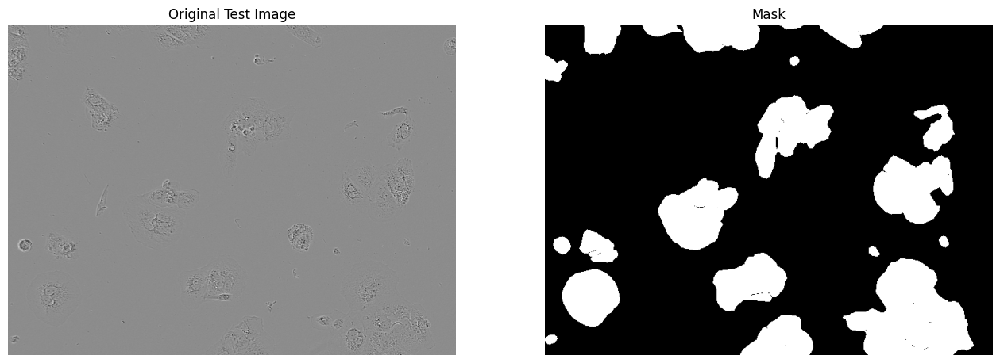

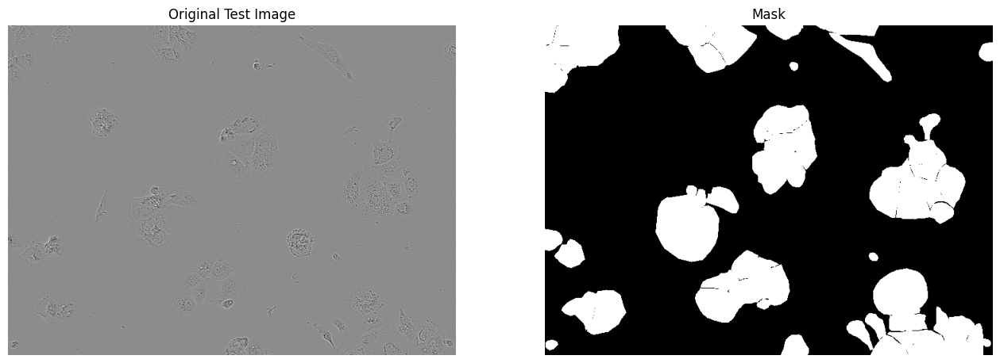

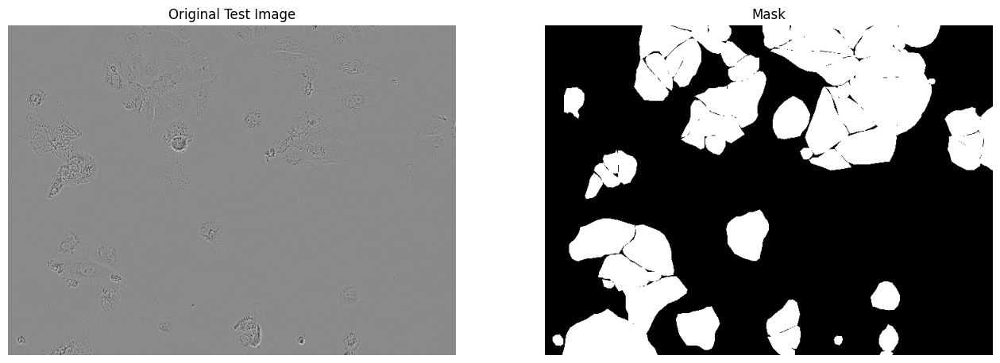

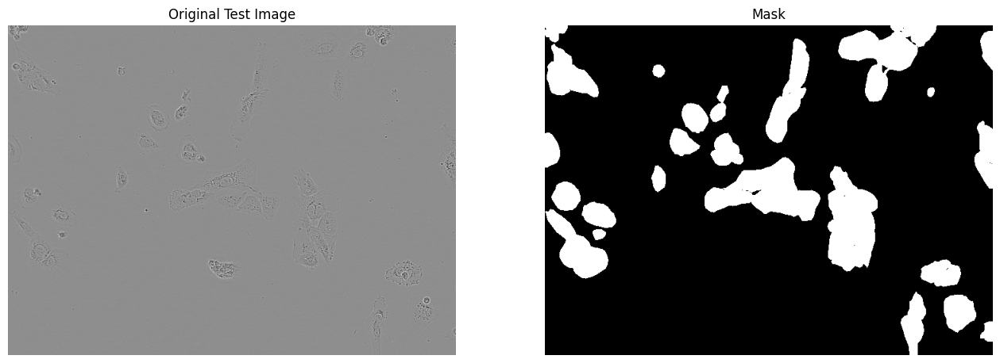

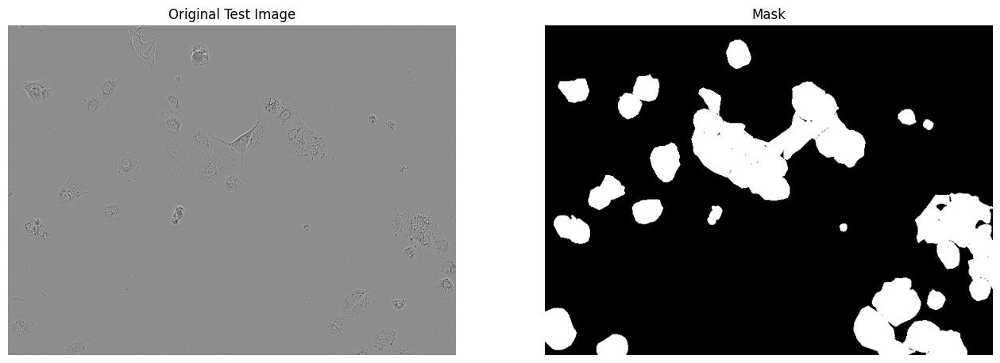

...

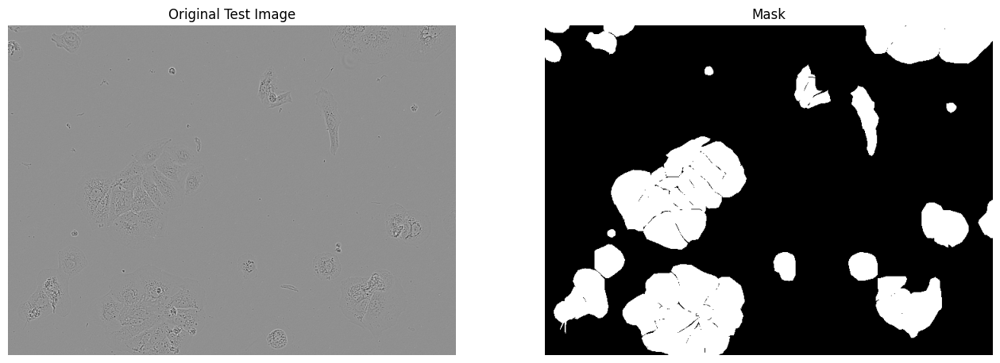

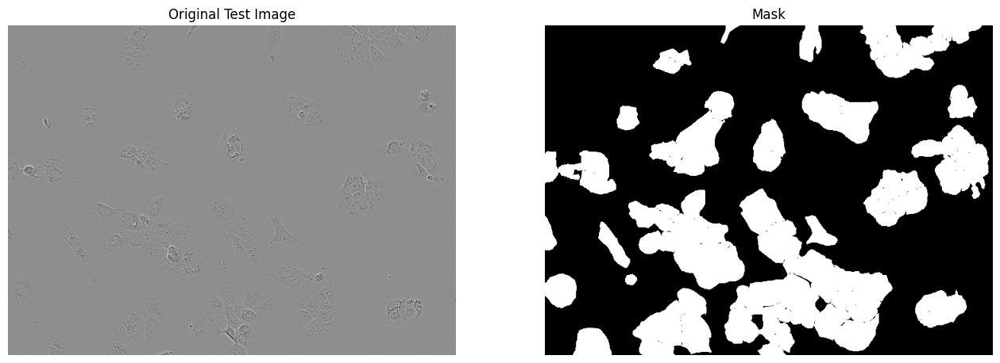

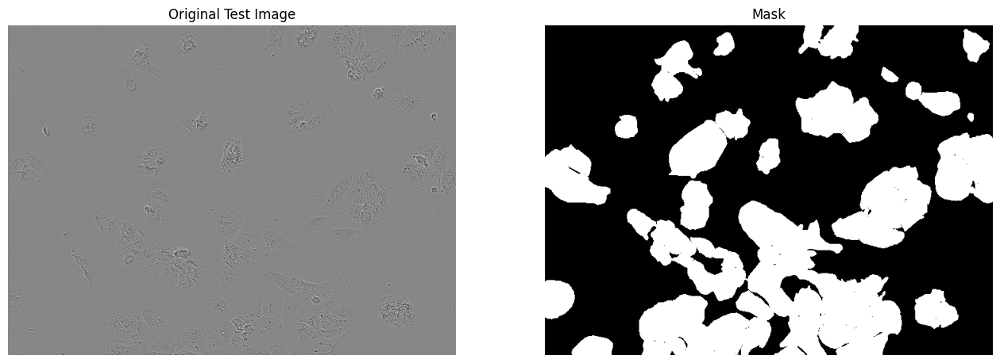

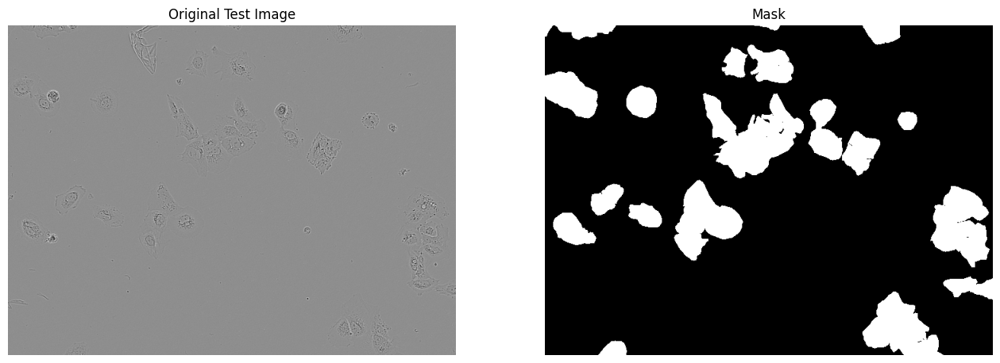

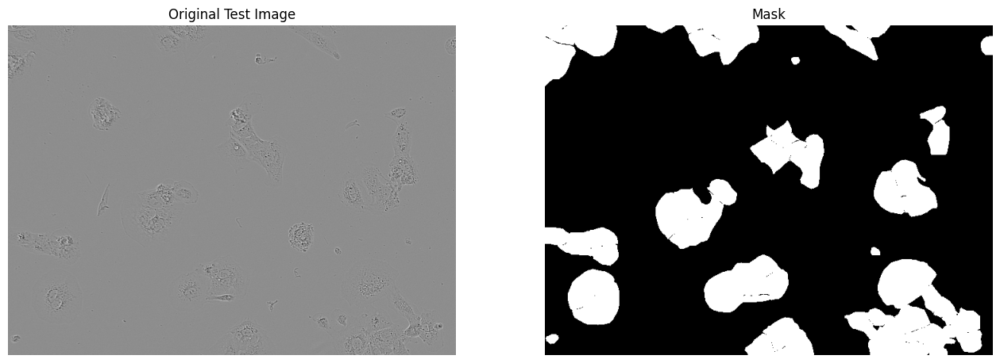

In [9]:
for i_batch, sample_batched in enumerate(data_loader):


        image = sample_batched['image'][0]  # Assuming the image is the first in the batch
        mask = sample_batched['annotations'][0] 
        image_np = image.squeeze().numpy()  # If necessary, add .cpu().detach() before .numpy() for GPU tensors
        mask_np = mask.squeeze().numpy()    # If necessary, add .cpu().detach() before .numpy() for GPU tensors

        # Now, plot the images side by side
        plt.figure(figsize=(16, 6))  # Adjust the figure size as needed

        # Plot the original image
        plt.subplot(1, 2, 1)  # (rows, columns, panel number)
        plt.imshow(image_np, cmap='gray')
        plt.axis('off')  # Hide the axes
        plt.title('Original Test Image')

        # Plot the mask
        plt.subplot(1, 2, 2)  # (rows, columns, panel number)
        plt.imshow(mask_np, cmap='gray')
        plt.axis('off')  # Hide the axes
        plt.title('Mask')

        plt.show()